# Anomaly detection based on the U-Net model 

### Loading the dataset

Prepare dataset from label_n_full.csv files where n is 0, 1, 2, 3
Next, we will seperate the data into train, validation and test sets with a ratio of 0.7 : 0.15 : 0.15

In [571]:
import pandas as pd
import numpy as np

label_0 = pd.read_csv("data/label_0_full.csv")
label_1 = pd.read_csv("data/label_1_full.csv")
label_2 = pd.read_csv("data/label_2_full.csv")
label_3 = pd.read_csv("data/label_3_full.csv")

len_0 = len(label_0)
len_1 = len(label_1)
len_2 = len(label_2)
len_3 = len(label_3)

label_X = [label_0, label_1, label_2, label_3]
rem = [len_0, len_1, len_2, len_3]

for i in range(4):
    r = rem[i] % 100
    label_X[i] = label_X[i].iloc[:rem[i] - r]

    print(len(label_X[i]))


y_label_0 = np.zeros(len(label_X[0]))
y_label_1 = np.ones(len(label_X[1]))
y_label_2 = np.full(len(label_X[2]), 2)  
y_label_3 = np.full(len(label_X[3]), 3)

print(label_X[0].shape, y_label_0.shape)
print(label_X[1].shape, y_label_1.shape)
print(label_X[2].shape, y_label_2.shape)
print(label_X[3].shape, y_label_3.shape)


1445800
1440100
1414800
1439900
(1445800, 3) (1445800,)
(1440100, 3) (1440100,)
(1414800, 3) (1414800,)
(1439900, 3) (1439900,)


In [572]:
y_label_0_df = pd.DataFrame(y_label_0)
y_label_1_df = pd.DataFrame(y_label_1)
y_label_2_df = pd.DataFrame(y_label_2)
y_label_3_df = pd.DataFrame(y_label_3)

label_X[0] = pd.concat([label_X[0], y_label_0_df], axis=1)
label_X[1] = pd.concat([label_X[1], y_label_1_df], axis=1)
label_X[2] = pd.concat([label_X[2], y_label_2_df], axis=1)
label_X[3] = pd.concat([label_X[3], y_label_3_df], axis=1)



In [573]:
print(label_X[0].shape)
print(label_X[1].shape)
print(label_X[2].shape)
print(label_X[3].shape)
print()
print(label_X[2])

(1445800, 4)
(1440100, 4)
(1414800, 4)
(1439900, 4)

          0.98585   0.00755  -0.042708  0
0        0.998885  0.008039  -0.032057  2
1        0.976504  0.005346  -0.039077  2
2        0.990523  0.008774  -0.037141  2
3        0.988555  0.006081  -0.029395  2
4        0.987571  0.008529  -0.034478  2
...           ...       ...        ... ..
1414795  0.975766 -0.002488  -0.111940  2
1414796  0.982898  0.000940  -0.107582  2
1414797  0.981177 -0.001753  -0.108793  2
1414798  0.981177 -0.001753  -0.108793  2
1414799  0.981915 -0.000774  -0.100320  2

[1414800 rows x 4 columns]


In [574]:
# remainder를 무작위로 split
def split_randomly_int(a, n):
    random_numbers = np.sort(np.random.randint(0, a, n - 1))

    parts = np.zeros(n, dtype=int)
    parts[0] = random_numbers[0]
    
    for i in range(1, n - 1):
        parts[i] = random_numbers[i] - random_numbers[i - 1]
    
    parts[-1] = a - random_numbers[-1]
    
    return parts


In [575]:

# 100을 max_parts로 split
def split_into_random_parts(total, min_size, max_parts):

    num_parts = np.random.randint(1, max_parts + 1)
    parts = [min_size] * num_parts

    remaining = total - num_parts * min_size

    if num_parts != 1:
        result = split_randomly_int(remaining, num_parts)

    else :
        result = [remaining]

    for i in range(num_parts):
        parts[i] += result[i]

    return parts

# 100을 랜덤하게 1, 2, 또는 3 등분으로 나누기
total = 100
min_size = 30
max_parts = 3


random_parts = split_into_random_parts(total, min_size, max_parts)
print("Randomly Split Parts:", random_parts)
print("Sum of Parts:", sum(random_parts))


Randomly Split Parts: [54, 46]
Sum of Parts: 100


In [576]:
data_remain_0 = len(y_label_0)
data_remain_1 = len(y_label_1)
data_remain_2 = len(y_label_2)
data_remain_3 = len(y_label_3)

print(data_remain_0)
data_remain = [data_remain_0, data_remain_1, data_remain_2, data_remain_3]
print(data_remain)

1445800
[1445800, 1440100, 1414800, 1439900]


In [577]:
data_0_start = 0
data_1_start = 0
data_2_start = 0
data_3_start = 0
data_starts = [data_0_start, data_1_start, data_2_start, data_3_start]

In [578]:
full_data = []
total = 100
min_size = 30

num_of_classes = 4

avail_class = []
func_break = False

In [579]:



def generate_timestamps_with_labels(data_start):
    max_parts = 3
    indices = [i for i, x in enumerate(data_remain) if x >= 100]
    count = len(indices)

    print("100 이상인 값의 개수:", count)
    print("100 이상인 값의 인덱스:", indices)

    if count < max_parts:
        max_parts = count
    
    random_parts = split_into_random_parts(total, min_size, max_parts)
    print(random_parts)
    
    selected_class = []
    previous_value = -1  

    
    i = 0
    while len(random_parts) > i:
        # 새로운 값을 무작위로 선택
        new_value = np.random.randint(0, num_of_classes)

        # 이전 값과 다를 경우에만 추가
        if new_value != previous_value and new_value in indices:
            selected_class.append(new_value)
            previous_value = new_value
            i += 1
    
    
    data = []
    print("sel", selected_class)

    for i in range(len(selected_class)):
        index = selected_class[i]
        print(data_start[index], random_parts[i])
        segment = label_X[index][data_start[index]:data_start[index]+random_parts[i]]
        data_remain[index] -= random_parts[i]
        data.append(segment)
        data_start[index] += random_parts[i]
    if len(data) != len(selected_class):
        print("len data", len(data))
        return -1
    
    data_array = np.concatenate(data)
    full_data.append(data_array)

    print(data_array.shape)
    if data_array.shape[0] != 100:
        return -1
    
    

    
    
        
# generate_timestamps_with_labels(data_starts)
# f = np.array(full_data)
# f.shape


In [580]:
num_of_data = sum(data_remain)

In [581]:
_ = 0
while _ < num_of_data // 100:
    a = generate_timestamps_with_labels(data_starts)
    print("data_starts", data_starts)
    print("data_remain", data_remain)
    if a == -1:
        break
    _ += 1

100 이상인 값의 개수: 4
100 이상인 값의 인덱스: [0, 1, 2, 3]
[100]
sel [2]
0 100
(100, 4)
data_starts [0, 0, 100, 0]
data_remain [1445800, 1440100, 1414700, 1439900]
100 이상인 값의 개수: 4
100 이상인 값의 인덱스: [0, 1, 2, 3]
[57, 43]
sel [2, 3]
100 57
0 43
(100, 4)
data_starts [0, 0, 157, 43]
data_remain [1445800, 1440100, 1414643, 1439857]
100 이상인 값의 개수: 4
100 이상인 값의 인덱스: [0, 1, 2, 3]
[100]
sel [0]
0 100
(100, 4)
data_starts [100, 0, 157, 43]
data_remain [1445700, 1440100, 1414643, 1439857]
100 이상인 값의 개수: 4
100 이상인 값의 인덱스: [0, 1, 2, 3]
[100]
sel [2]
157 100
(100, 4)
data_starts [100, 0, 257, 43]
data_remain [1445700, 1440100, 1414543, 1439857]
100 이상인 값의 개수: 4
100 이상인 값의 인덱스: [0, 1, 2, 3]
[31, 34, 35]
sel [0, 2, 0]
100 31
257 34
131 35
(100, 4)
data_starts [166, 0, 291, 43]
data_remain [1445634, 1440100, 1414509, 1439857]
100 이상인 값의 개수: 4
100 이상인 값의 인덱스: [0, 1, 2, 3]
[31, 32, 37]
sel [3, 0, 2]
43 31
166 32
291 37
(100, 4)
data_starts [198, 0, 328, 74]
data_remain [1445602, 1440100, 1414472, 1439826]
100 이상인 값의 개

ValueError: low >= high

In [582]:
print(_)
print(sum(data_remain))

57403
300


In [584]:
len(full_data)
a = np.array(full_data)
a.shape

(57403, 100, 4)

In [ ]:
# filtered_data = [data for data in full_data if len(data) >= 100]

In [585]:
shuffled_data = np.array(full_data)

In [586]:
shuffled_data.shape

(57403, 100, 4)

In [596]:
y = shuffled_data[:, :, -1]  # (57403, 100) 형태
x_data = shuffled_data[:, :, :-1]  # (57403, 100, 3) 형태

print("마지막 컬럼의 형태:", y.shape)  # (57403, 100)
print("나머지 데이터의 형태:", x_data.shape)  # (57403, 100, 3)

y[0]
x_data[0].shape

마지막 컬럼의 형태: (57403, 100)
나머지 데이터의 형태: (57403, 100, 3)


(100, 3)

In [597]:
# 대략적인 y의 비율(라벨 데이터 비율 계산)
unique, counts = np.unique(y, return_counts=True)

total_count = y.size 
ratios = counts / total_count


for class_label, count, ratio in zip(unique, counts, ratios):
    print(f"클래스 {class_label}: 개수 = {count}, 비율 = {ratio:.4f}")

클래스 0.0: 개수 = 1445750, 비율 = 0.2519
클래스 1.0: 개수 = 1440043, 비율 = 0.2509
클래스 2.0: 개수 = 1414706, 비율 = 0.2465
클래스 3.0: 개수 = 1439801, 비율 = 0.2508


### y one hot encoding

In [598]:
from keras.utils import to_categorical

# Convert y_train and y_valid to one-hot encoding
y_one_hot = to_categorical(y, num_classes=4) 

In [600]:
y_one_hot.shape

(57403, 100, 4)

In [601]:
num_samples = y_one_hot.shape[0]

train_size = int(0.7 * num_samples)
val_size = int(0.15 * num_samples)

train_size, val_size

(40182, 8610)

In [603]:
x_train = x_data[:train_size]
x_val = x_data[train_size:train_size + val_size]
x_test = x_data[train_size + val_size:]

y_train = y_one_hot[:train_size]
y_val = y_one_hot[train_size:train_size + val_size]
y_test = y_one_hot[train_size + val_size:]

# 데이터 크기 확인
print(x_train.shape, x_val.shape, x_test.shape)
print(y_train.shape, y_val.shape, y_test.shape)

(40182, 100, 3) (8610, 100, 3) (8611, 100, 3)
(40182, 100, 4) (8610, 100, 4) (8611, 100, 4)


In [604]:
import tensorflow as tf
from tensorflow.keras import layers, models


# Define the U-Net model
def unet_model(input_shape=(100, 3), num_classes=4):
    inputs = layers.Input(input_shape)

    # Encoder (downsampling path)
    conv1 = layers.Conv1D(32, kernel_size=3, activation='relu', padding='same')(inputs)
    conv1 = layers.Conv1D(32, kernel_size=3, activation='relu', padding='same')(conv1)
    pool1 = layers.MaxPooling1D(2)(conv1)

    conv2 = layers.Conv1D(64, kernel_size=3, activation='relu', padding='same')(pool1)
    conv2 = layers.Conv1D(64, kernel_size=3, activation='relu', padding='same')(conv2)
    pool2 = layers.MaxPooling1D(2)(conv2)

    conv3 = layers.Conv1D(128,  kernel_size=3, activation='relu', padding='same')(pool2)
    conv3 = layers.Conv1D(128,  kernel_size=3, activation='relu', padding='same')(conv3)
    pool3 = layers.MaxPooling1D(pool_size=2)(conv3)

    conv4 = layers.Conv1D(256,  kernel_size=3, activation='relu', padding='same')(pool3)
    conv4 = layers.Conv1D(256,  kernel_size=3, activation='relu', padding='same')(conv4)
    pool4 = layers.MaxPooling1D(pool_size=2)(conv4)

    # Bottleneck
    conv5 = layers.Conv1D(512,  kernel_size=3, activation='relu', padding='same')(pool4)
    conv5 = layers.Conv1D(512,  kernel_size=3, activation='relu', padding='same')(conv5)

    # Decoder (upsampling path)
    up6 = layers.Conv1DTranspose(256, kernel_size=2, strides=2, padding='same')(conv5)
    print(up6.shape, conv4.shape)
    up6 = layers.concatenate([up6, conv4])

    conv6 = layers.Conv1D(256,  kernel_size=3, activation='relu', padding='same')(up6)
    conv6 = layers.Conv1D(256,  kernel_size=3, activation='relu', padding='same')(conv6)

    up7 = layers.Conv1DTranspose(128, kernel_size=2, strides=2, padding='same')(conv6)
    up7 = layers.ZeroPadding1D(padding=(1, 0))(up7)
    print(up7.shape, conv3.shape)
    up7 = layers.concatenate([up7, conv3])
    conv7 = layers.Conv1D(128,  kernel_size=3, activation='relu', padding='same')(up7)
    conv7 = layers.Conv1D(128,  kernel_size=3, activation='relu', padding='same')(conv7)

    up8 = layers.Conv1DTranspose(64, kernel_size=2, strides=2, padding='same')(conv7)
    up8 = layers.concatenate([up8, conv2])
    conv8 = layers.Conv1D(64,  kernel_size=3, activation='relu', padding='same')(up8)
    conv8 = layers.Conv1D(64,  kernel_size=3, activation='relu', padding='same')(conv8)

    up9 = layers.Conv1DTranspose(32, kernel_size=2, strides=2, padding='same')(conv8)
    up9 = layers.concatenate([up9, conv1])
    conv9 = layers.Conv1D(32,  kernel_size=3, activation='relu', padding='same')(up9)
    conv9 = layers.Conv1D(32,  kernel_size=3, activation='relu', padding='same')(conv9)

    # Output layer for multi-class classification (4 classes)
    outputs = layers.Conv1D(num_classes, kernel_size=1, activation='softmax')(conv9)

    # Model compilation
    model = models.Model(inputs=[inputs], outputs=[outputs])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Instantiate and view the model summary
model = unet_model()
model.summary()


(None, 12, 256) (None, 12, 256)
(None, 25, 128) (None, 25, 128)


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 100, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d (Conv1D)     │ (None, 100, 32)   │        320 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1 (Conv1D)   │ (None, 100, 32)   │      3,104 │ conv1d[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d       │ (None, 50, 32)    │          0 │ conv1d_1[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2 (Conv1D)   │ (None, 50, 64)    │      6,208 │ max_pooling1d[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_3 (Conv1D)   │ (None, 50, 64)    │     12,352 │ conv1d_2[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_1     │ (None, 25, 64)    │          0 │ conv1d_3[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_4 (Conv1D)   │ (None, 25, 128)   │     24,704 │ max_pooling1d_1[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_5 (Conv1D)   │ (None, 25, 128)   │     49,280 │ conv1d_4[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_2     │ (None, 12, 128)   │          0 │ conv1d_5[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_6 (Conv1D)   │ (None, 12, 256)   │     98,560 │ max_pooling1d_2[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_7 (Conv1D)   │ (None, 12, 256)   │    196,864 │ conv1d_6[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_3     │ (None, 6, 256)    │          0 │ conv1d_7[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_8 (Conv1D)   │ (None, 6, 512)    │    393,728 │ max_pooling1d_3[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_9 (Conv1D)   │ (None, 6, 512)    │    786,944 │ conv1d_8[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_transpose    │ (None, 12, 256)   │    262,400 │ conv1d_9[0][0]    │
│ (Conv1DTranspose)   │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 12, 512)   │          0 │ conv1d_transpose… │
│ (Concatenate)       │                   │            │ conv1d_7[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_10 (Conv1D)  │ (None, 12, 256)   │    393,472 │ concatenate[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_11 (Conv1D)  │ (None, 12, 256)   │    196,864 │ conv1d_10[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_transpose_1  │ (None, 24, 128)   │     65,664 │ conv1d_11[0][0]   │
│ (Conv1DTranspose)   │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding1d      │ (None, 25, 128)   │          0 │ conv1d_transpose

 Total params: 2,705,156 (10.32 MB)

 Trainable params: 2,705,156 (10.32 MB)

 Non-trainable params: 0 (0.00 B)

In [605]:
from keras.callbacks import EarlyStopping
early_stop = EarlyStopping(monitor='loss', patience=1, verbose=1)

In [606]:
history = model.fit(
    x_train, y_train,  # Ensure y_train is one-hot encoded for multi-class
    epochs=20,
    batch_size=32,
    validation_data=(x_val, y_val),
    verbose=1,
    # class_weight=class_weights_dict,
    callbacks=[early_stop]
)

# Save the model
model.save("u_net_with_aug_v1.h5")

Epoch 1/20
1256/1256 ━━━━━━━━━━━━━━━━━━━━ 65s 50ms/step - accuracy: 0.6795 - loss: 0.6708 - val_accuracy: 0.6681 - val_loss: 0.8083
Epoch 2/20
1256/1256 ━━━━━━━━━━━━━━━━━━━━ 61s 49ms/step - accuracy: 0.8783 - loss: 0.2879 - val_accuracy: 0.5363 - val_loss: 3.9742
Epoch 3/20
1256/1256 ━━━━━━━━━━━━━━━━━━━━ 62s 50ms/step - accuracy: 0.9194 - loss: 0.2026 - val_accuracy: 0.6119 - val_loss: 4.8727
Epoch 4/20
1256/1256 ━━━━━━━━━━━━━━━━━━━━ 68s 54ms/step - accuracy: 0.9477 - loss: 0.1372 - val_accuracy: 0.6200 - val_loss: 3.3104
Epoch 5/20
1256/1256 ━━━━━━━━━━━━━━━━━━━━ 77s 61ms/step - accuracy: 0.9560 - loss: 0.1181 - val_accuracy: 0.6338 - val_loss: 2.9720
Epoch 6/20
1256/1256 ━━━━━━━━━━━━━━━━━━━━ 71s 57ms/step - accuracy: 0.9686 - loss: 0.0839 - val_accuracy: 0.6324 - val_loss: 3.7737
Epoch 7/20
1256/1256 ━━━━━━━━━━━━━━━━━━━━ 73s 59ms/step - accuracy: 0.9738 - loss: 0.0689 - val_accuracy: 0.6360 - val_loss: 3.5095
Epoch 8/20
1256/1256 ━━━━━━━━━━━━━━━━━━━━ 76s 60ms/step - accuracy: 0.9710 -

In [607]:
# model1 (u net with data aug)
loss, accuracy = model.evaluate(x_test, y_test, verbose=1)
print(loss)
print(accuracy)

270/270 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.4968 - loss: 4.7407
4.607545375823975
0.506630003452301


In [608]:
y_pred = model.predict(x_test)

270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step


In [613]:
y_pred.shape

(8611, 100, 4)

In [614]:
y_pred_classes = np.argmax(y_pred, axis=-1)


In [617]:
y_pred_classes.shape

(8611, 100)

In [618]:
y_test.shape

(8611, 100, 4)

In [619]:
y_test_classes = np.argmax(y_test, axis=-1)

In [620]:
y_test_classes.shape

(8611, 100)

In [624]:
from sklearn.metrics import confusion_matrix, classification_report

y_test_flatten = y_test_classes.flatten()
y_pred_flatten = y_pred_classes.flatten()

print(classification_report(y_test_flatten, y_pred_flatten))

# 혼동 행렬 계산
cm = confusion_matrix(y_test_flatten, y_pred_flatten)

# 혼동 행렬 출력
print("혼동 행렬:")
print(cm)

              precision    recall  f1-score   support

           0       0.00      0.00      0.00    233693
           1       0.93      0.99      0.96    226492
           2       1.00      0.00      0.00    186073
           3       0.34      0.98      0.51    214842

    accuracy                           0.51    861100
   macro avg       0.57      0.49      0.37    861100
weighted avg       0.55      0.51      0.38    861100

혼동 행렬:
[[     1  15702      0 217990]
 [     7 225233      0   1252]
 [   296    624     10 185143]
 [  3459    368      0 211015]]


In [625]:
# model2 

# Define the U-Net model
def unet_model(input_shape=(100, 3), num_classes=4):
    inputs = layers.Input(input_shape)

    # Encoder (downsampling path)
    conv1 = layers.Conv1D(32, kernel_size=3, activation='relu', padding='same')(inputs)
    conv1 = layers.Conv1D(32, kernel_size=3, activation='relu', padding='same')(conv1)
    pool1 = layers.MaxPooling1D(2)(conv1)

    conv2 = layers.Conv1D(64, kernel_size=3, activation='relu', padding='same')(pool1)
    conv2 = layers.Conv1D(64, kernel_size=3, activation='relu', padding='same')(conv2)
    pool2 = layers.MaxPooling1D(2)(conv2)

    conv3 = layers.Conv1D(128,  kernel_size=3, activation='relu', padding='same')(pool2)
    conv3 = layers.Conv1D(128,  kernel_size=3, activation='relu', padding='same')(conv3)



    up8 = layers.Conv1DTranspose(64, kernel_size=2, strides=2, padding='same')(conv3)
    up8 = layers.concatenate([up8, conv2])
    conv8 = layers.Conv1D(64,  kernel_size=3, activation='relu', padding='same')(up8)
    conv8 = layers.Conv1D(64,  kernel_size=3, activation='relu', padding='same')(conv8)

    up9 = layers.Conv1DTranspose(32, kernel_size=2, strides=2, padding='same')(conv8)
    up9 = layers.concatenate([up9, conv1])
    conv9 = layers.Conv1D(32,  kernel_size=3, activation='relu', padding='same')(up9)
    conv9 = layers.Conv1D(32,  kernel_size=3, activation='relu', padding='same')(conv9)

    # Output layer for multi-class classification (4 classes)
    outputs = layers.Conv1D(num_classes, kernel_size=1, activation='softmax')(conv9)

    # Model compilation
    model = models.Model(inputs=[inputs], outputs=[outputs])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Instantiate and view the model summary
model = unet_model()
model.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 100, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_19 (Conv1D)  │ (None, 100, 32)   │        320 │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_20 (Conv1D)  │ (None, 100, 32)   │      3,104 │ conv1d_19[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_4     │ (None, 50, 32)    │          0 │ conv1d_20[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_21 (Conv1D)  │ (None, 50, 64)    │      6,208 │ max_pooling1d_4[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_22 (Conv1D)  │ (None, 50, 64)    │     12,352 │ conv1d_21[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_5     │ (None, 25, 64)    │          0 │ conv1d_22[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_23 (Conv1D)  │ (None, 25, 128)   │     24,704 │ max_pooling1d_5[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_24 (Conv1D)  │ (None, 25, 128)   │     49,280 │ conv1d_23[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_transpose_4  │ (None, 50, 64)    │     16,448 │ conv1d_24[0][0]   │
│ (Conv1DTranspose)   │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_4       │ (None, 50, 128)   │          0 │ conv1d_transpose… │
│ (Concatenate)       │                   │            │ conv1d_22[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_25 (Conv1D)  │ (None, 50, 64)    │     24,640 │ concatenate_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_26 (Conv1D)  │ (None, 50, 64)    │     12,352 │ conv1d_25[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_transpose_5  │ (None, 100, 32)   │      4,128 │ conv1d_26[0][0]   │
│ (Conv1DTranspose)   │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_5       │ (None, 100, 64)   │          0 │ conv1d_transpose… │
│ (Concatenate)       │                   │            │ conv1d_20[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_27 (Conv1D)  │ (None, 100, 32)   │      6,176 │ concatenate_5[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_28 (Conv1D)  │ (None, 100, 32)   │      3,104 │ conv1d_27[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_29 (Conv1D)  │ (None, 100, 4)    │        132 │ conv1d_28[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 162,948 (636.52 KB)

 Trainable params: 162,948 (636.52 KB)

 Non-trainable params: 0 (0.00 B)

In [631]:
history = model.fit(
    x_train, y_train,  # Ensure y_train is one-hot encoded for multi-class
    epochs=20,
    batch_size=64,
    validation_data=(x_val, y_val),
    verbose=1,
    # class_weight=class_weights_dict,
    callbacks=[early_stop]
)

# Save the model
model.save("u_net_with_aug_v2.h5")

Epoch 1/20
628/628 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - accuracy: 0.9620 - loss: 0.0994 - val_accuracy: 0.6182 - val_loss: 3.3401
Epoch 2/20
628/628 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - accuracy: 0.9660 - loss: 0.0887 - val_accuracy: 0.6307 - val_loss: 3.5215
Epoch 2: early stopping


In [632]:
# model2 (u net with data aug)
loss, accuracy = model.evaluate(x_test, y_test, verbose=1)
print(loss)
print(accuracy)

270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4960 - loss: 4.7995
4.697624206542969
0.5058321952819824


In [628]:
from sklearn.metrics import confusion_matrix, classification_report

y_pred_classes = np.argmax(y_pred, axis=-1)
y_test_classes = np.argmax(y_test, axis=-1)

y_test_flatten = y_test_classes.flatten()
y_pred_flatten = y_pred_classes.flatten()

print(classification_report(y_test_flatten, y_pred_flatten))

# 혼동 행렬 계산
cm = confusion_matrix(y_test_flatten, y_pred_flatten)

# 혼동 행렬 출력
print("혼동 행렬:")
print(cm)

              precision    recall  f1-score   support

           0       0.00      0.00      0.00    233693
           1       0.93      0.99      0.96    226492
           2       1.00      0.00      0.00    186073
           3       0.34      0.98      0.51    214842

    accuracy                           0.51    861100
   macro avg       0.57      0.49      0.37    861100
weighted avg       0.55      0.51      0.38    861100

혼동 행렬:
[[     1  15702      0 217990]
 [     7 225233      0   1252]
 [   296    624     10 185143]
 [  3459    368      0 211015]]


### Model fine tuning

In [684]:
from tensorflow.keras.models import load_model

# 이미 학습된 모델 불러오기
model = load_model('u_net_v2.h5')
loss, accuracy = model.evaluate(x_test, y_test, verbose=1)
print(loss)
print(accuracy)


270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6513 - loss: 5.4177
5.6602301597595215
0.6386961936950684


In [685]:
from sklearn.metrics import confusion_matrix, classification_report

y_pred_classes = np.argmax(y_pred, axis=-1)
y_test_classes = np.argmax(y_test, axis=-1)

y_test_flatten = y_test_classes.flatten()
y_pred_flatten = y_pred_classes.flatten()

print(classification_report(y_test_flatten, y_pred_flatten))

# 혼동 행렬 계산
cm = confusion_matrix(y_test_flatten, y_pred_flatten)

# 혼동 행렬 출력
print("혼동 행렬:")
print(cm)

              precision    recall  f1-score   support

           0       0.07      0.00      0.01    233693
           1       0.91      1.00      0.95    226492
           2       0.98      0.92      0.95    186073
           3       0.46      0.91      0.61    214842

    accuracy                           0.69    861100
   macro avg       0.61      0.71      0.63    861100
weighted avg       0.59      0.69      0.61    861100

혼동 행렬:
[[  1087  11303   2478 218825]
 [   326 225392     53    721]
 [  2613   3476 170536   9448]
 [ 10708   7055    994 196085]]


In [640]:
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7       │ (None, 100, 3)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_77 (Conv1D)  │ (None, 100, 32)   │        320 │ input_layer_7[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_78 (Conv1D)  │ (None, 100, 32)   │      3,104 │ conv1d_77[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_20    │ (None, 50, 32)    │          0 │ conv1d_78[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_79 (Conv1D)  │ (None, 50, 64)    │      6,208 │ max_pooling1d_20… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_80 (Conv1D)  │ (None, 50, 64)    │     12,352 │ conv1d_79[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_21    │ (None, 25, 64)    │          0 │ conv1d_80[0][0]   │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_81 (Conv1D)  │ (None, 25, 128)   │     24,704 │ max_pooling1d_21… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_82 (Conv1D)  │ (None, 25, 128)   │     49,280 │ conv1d_81[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_transpose_14 │ (None, 50, 64)    │     16,448 │ conv1d_82[0][0]   │
│ (Conv1DTranspose)   │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_14      │ (None, 50, 128)   │          0 │ conv1d_transpose… │
│ (Concatenate)       │                   │            │ conv1d_80[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_83 (Conv1D)  │ (None, 50, 64)    │     24,640 │ concatenate_14[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_84 (Conv1D)  │ (None, 50, 64)    │     12,352 │ conv1d_83[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_transpose_15 │ (None, 100, 32)   │      4,128 │ conv1d_84[0][0]   │
│ (Conv1DTranspose)   │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_15      │ (None, 100, 64)   │          0 │ conv1d_transpose… │
│ (Concatenate)       │                   │            │ conv1d_78[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_85 (Conv1D)  │ (None, 100, 32)   │      6,176 │ concatenate_15[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_86 (Conv1D)  │ (None, 100, 32)   │      3,104 │ conv1d_85[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_87 (Conv1D)  │ (None, 100, 4)    │        132 │ conv1d_86[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 162,950 (636.53 KB)

 Trainable params: 162,948 (636.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [686]:
# 모델의 모든 레이어를 동결 (기본)
for layer in model.layers:
    layer.trainable = False

# 마지막 5개의 레이어만 학습 가능하게 설정
for layer in model.layers[-5:]: 
    layer.trainable = True


In [687]:
from tensorflow.keras.optimizers import Adam
optimizer = Adam(learning_rate=1e-4) 
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


In [688]:
history = model.fit(
    x_train, y_train,  # Ensure y_train is one-hot encoded for multi-class
    epochs=10,
    batch_size=32,
    validation_data=(x_val, y_val),
    verbose=1,
    # class_weight=class_weights_dict,
    callbacks=[early_stop]
)

# Save the model
model.save("u_net_2_aug_finetuning_v1.h5")

Epoch 1/10
1256/1256 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - accuracy: 0.8903 - loss: 0.4158 - val_accuracy: 0.7827 - val_loss: 1.1592
Epoch 2/10
1256/1256 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.9175 - loss: 0.2166 - val_accuracy: 0.7861 - val_loss: 1.1415
Epoch 2: early stopping


In [689]:

loss, accuracy = model.evaluate(x_test, y_test, verbose=1)
print(loss)
print(accuracy)

270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7052 - loss: 1.7651
1.9465014934539795
0.6875995993614197


In [690]:
y_pred = model.predict(x_test)

270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


In [691]:
from sklearn.metrics import confusion_matrix, classification_report

y_pred_classes = np.argmax(y_pred, axis=-1)
y_test_classes = np.argmax(y_test, axis=-1)

y_test_flatten = y_test_classes.flatten()
y_pred_flatten = y_pred_classes.flatten()

print(classification_report(y_test_flatten, y_pred_flatten))

# 혼동 행렬 계산
cm = confusion_matrix(y_test_flatten, y_pred_flatten)

# 혼동 행렬 출력
print("혼동 행렬:")
print(cm)

              precision    recall  f1-score   support

           0       0.06      0.00      0.01    233693
           1       0.92      0.99      0.96    226492
           2       0.96      0.92      0.94    186073
           3       0.46      0.91      0.61    214842

    accuracy                           0.69    861100
   macro avg       0.60      0.71      0.63    861100
weighted avg       0.58      0.69      0.61    861100

혼동 행렬:
[[   766   9429   3347 220151]
 [   232 224883    390    987]
 [  1234   2912 171920  10007]
 [ 11100   5981   3238 194523]]


In [670]:
y_test_flatten.shape

(861100,)

In [668]:
samples = x_test.shape[0]  # 8611
time_steps = x_test.shape[1]  # 100
features = x_test.shape[2]  # 3

x_test_reshaped = x_test.reshape(-1, 3)

# DataFrame으로 변환
df_x_test = pd.DataFrame(x_test_reshaped)

# DataFrame 출력
print(df_x_test.head())
print(df_x_test.shape)


          0         1         2
0  0.969863 -0.010322 -0.135420
1  0.908869 -0.006895 -0.109761
2  0.950925  0.002653 -0.099836
3  0.989047 -0.005426 -0.122348
4  0.930266 -0.004202 -0.094269
(861100, 3)
(861100, 4)


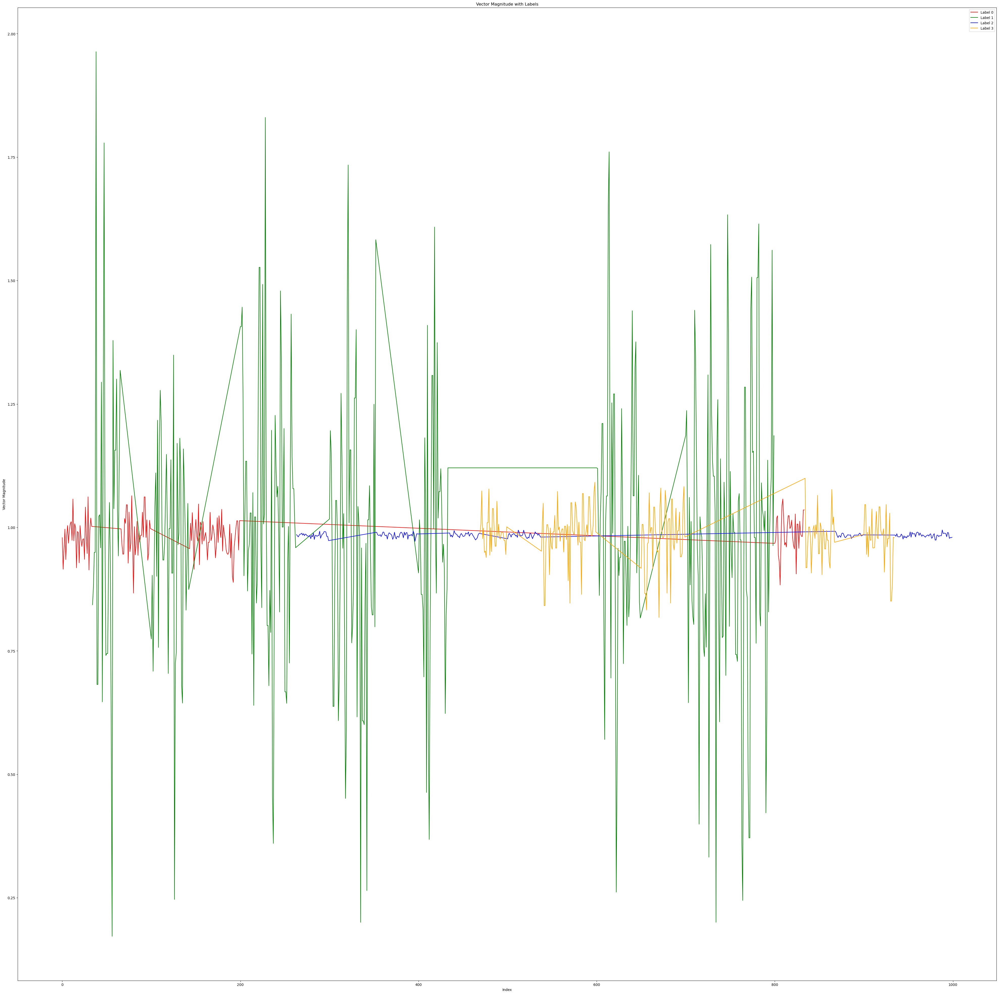

In [682]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import gaussian_filter1d

def multiple_plotting(datas, y_labels):
    # 파일 경로, 이름 설정해주세요.
    data_df = datas

    data_df.columns = ['x', 'y', 'z']

    plt.figure(figsize=(50,50))
    vector_value1 = np.sqrt(data_df['x']** 2 + data_df['y']**2 + data_df['z']**2)
    colors = ['red', 'green', 'blue', 'orange']  # 각 라벨에 대한 색상
    for label in np.unique(y_labels):
        plt.plot(vector_value1[y_labels == label], color=colors[label], label=f'Label {label}')
    plt.title('Vector Magnitude with Labels')
    plt.xlabel('Index')
    plt.ylabel('Vector Magnitude')
    plt.legend()

    
    
    # plt.plot(vector_value1)
    # plt.show()

multiple_plotting(df_x_test[:1000], y_test_flatten[:1000])

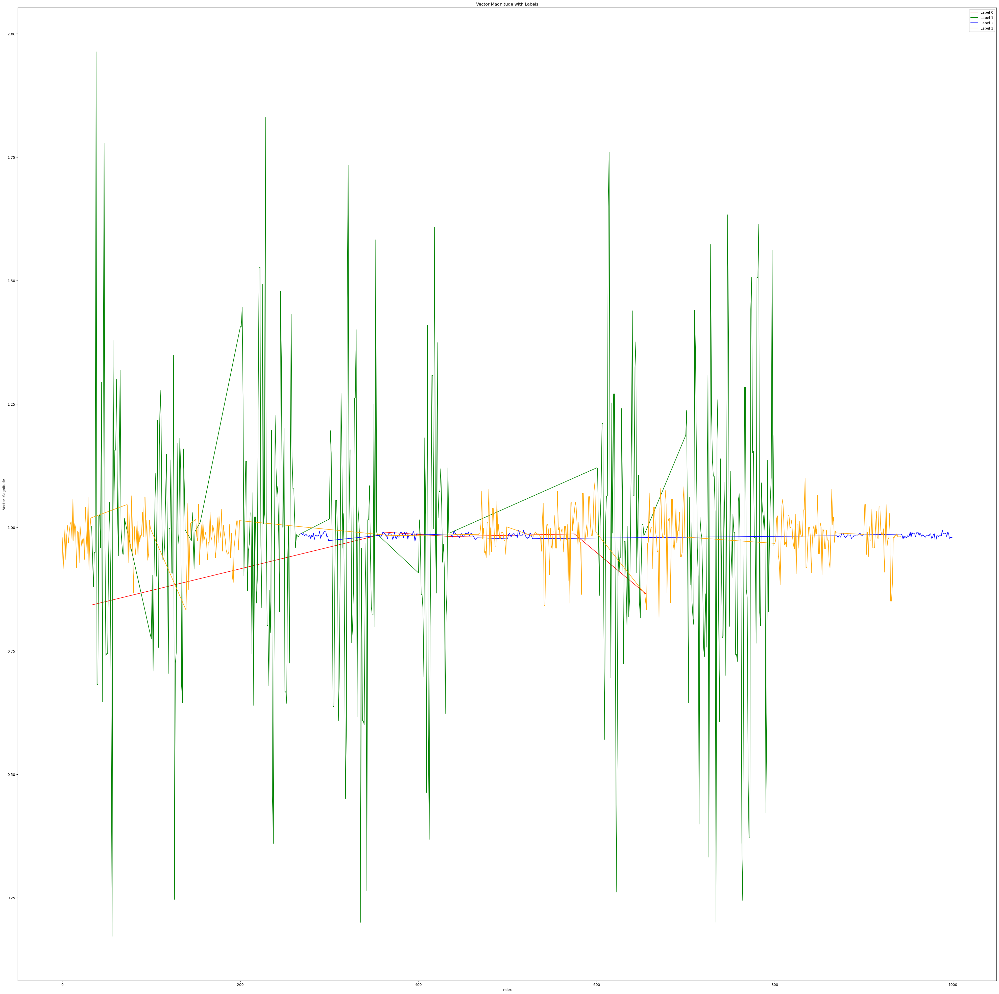

In [683]:
multiple_plotting(df_x_test[:1000], y_pred_flatten[:1000])